t‑SNE: нелинейное вложение, оптимизирует дивергенцию Кульбака–Лейблера между распределениями близостей точек, хорошо показывает локальные кластеры, но медленно, плохо сохраняет глобальные расстояния, чувствительно к perplexity и random_state.

UMAP: основан на теории многобразий и топологии, строит взвешенный граф соседей и оптимизирует кросс‑энтропию; быстрее t‑SNE, лучше сохраняет глобальную структуру, более устойчив к малым изменениям параметров (n_neighbors, min_dist).

TriMAP: ориентирован на сохранение глобальной структуры через тройки точек (anchor, сосед, далёкий), улучшает глобальное расположение кластеров при сохранении локальной структуры.

PaCMAP: управляет соотношением близких, средних и далёких пар, чтобы одновременно хорошо держать локальные кластеры и общую форму; показывает хорошие результаты на омикс‑данных и эмбеддингах.

PHATE: использует диффузионные процессы и потенциал для визуализации непрерывных траекторий (например, дифференцировка клеток), хорошо показывает как кластеры, так и переходы между ними.

In [5]:
%pip install umap-learn trimap pacmap phate scikit-learn seaborn

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import pairwise_distances

from sklearn.manifold import TSNE
import umap
import trimap
import pacmap
import phate

In [7]:
iris = load_iris()
X_iris = iris.data
y_iris = iris.target
feature_names_iris = iris.feature_names
print(X_iris.shape, np.unique(y_iris))

(150, 4) [0 1 2]


In [8]:
path = "Dry_Bean_Dataset.csv"
df = pd.read_csv(path)
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


## Убираем выбросы в данных

In [9]:
q = 0.999

feature_names = [x for x in df.columns if x != 'Class']
for feature in feature_names:
    df = df[df[feature] < df[feature].quantile(q)]
df

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
5,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,0.989510,0.943852,0.923726,0.007020,0.003153,0.853270,0.999236,SEKER
6,30477,670.033,211.050155,184.039050,1.146768,0.489478,30970,196.988633,0.762402,0.984081,0.853080,0.933374,0.006925,0.003242,0.871186,0.999049,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DERMASON
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DERMASON
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DERMASON
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DERMASON


In [10]:
feature_cols = [c for c in df.columns if c != "Class"]
X_own = df[feature_cols].values
y_own = df["Class"].values
print(X_own.shape, len(np.unique(y_own)))

(13387, 16) 7


In [11]:
target_class_names_dict = {
    'BARBUNYA': 'BARBUNYA',
    'BOMBAY': 'BOMBAY',
    'CALI': 'CALI',
    'DERMASON': 'DERMASON',
    'HOROZ': 'HOROZ',
    'SEKER': 'SEKER',
    'SIRA': 'SIRA'
}
target_class_names_dict

{'BARBUNYA': 'BARBUNYA',
 'BOMBAY': 'BOMBAY',
 'CALI': 'CALI',
 'DERMASON': 'DERMASON',
 'HOROZ': 'HOROZ',
 'SEKER': 'SEKER',
 'SIRA': 'SIRA'}

In [12]:
y_own_labels = np.array([target_class_names_dict[y_] for y_ in y_own])
y_own_labels

array(['SEKER', 'SEKER', 'SEKER', ..., 'DERMASON', 'DERMASON', 'DERMASON'],
      dtype='<U8')

In [13]:
scaler_iris = StandardScaler()
X_iris_scaled = scaler_iris.fit_transform(X_iris)

scaler_own = StandardScaler()
X_own_scaled = scaler_own.fit_transform(X_own)

Функции для DR и оценки разделения

In [14]:
def run_tsne(X, random_state=42, perplexity=30, learning_rate=200, n_iter=1000):
    tsne = TSNE(
        random_state=random_state,
        perplexity=perplexity,
        learning_rate=learning_rate,
    )
    return tsne.fit_transform(X)

def run_umap(X, random_state=42, n_neighbors=15, min_dist=0.1):
    Umap = umap.UMAP(
        random_state=random_state,
        n_neighbors=n_neighbors,
        min_dist=min_dist
    )
    return Umap.fit_transform(X)

def run_trimap(X, n_inliers=10, n_outliers=5):
    Trimap = trimap.TRIMAP(
        n_inliers=n_inliers,
        n_outliers=n_outliers
    )
    return Trimap.fit_transform(X)

def run_pacmap(X, random_state=42, n_neighbors=10):
    Pacmap = pacmap.PaCMAP(
        random_state=random_state,
        n_neighbors=n_neighbors
    )
    return Pacmap.fit_transform(X)

def run_phate(X, random_state=42, knn=15):
    phate_op = phate.PHATE(
        random_state=random_state,
        knn=knn
    )
    return phate_op.fit_transform(X)

Функция оценки качества разделения

In [15]:
def separation_score(X_2d, y):
    D = pairwise_distances(X_2d)
    same = D[y[:, None] == y[None, :]]
    diff = D[y[:, None] != y[None, :]]
    return same.mean(), diff.mean(), diff.mean() / same.mean()

In [16]:
# Отрисовка

def plot_embedding(X_2d, y, title):
    plt.figure(figsize=(6, 5))
    sns.scatterplot(
        x=X_2d[:, 0],
        y=X_2d[:, 1],
        hue=y,
        palette="tab10",
        s=30,
        legend="full"
    )
    plt.title(title)
    plt.xticks([])
    plt.yticks([])
    plt.legend(title="Класс", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    plt.show()

## IRIS

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Calculating PHATE...
  Running PHATE on 150 observations and 4 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculating affinities...


/usr/local/lib/python3.12/dist-packages/graphtools/graphs.py:803: RuntimeWarning: Detected zero distance between samples 101 and 142. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    Calculated affinities in 2.50 seconds.
  Calculated graph and diffusion operator in 2.52 seconds.
  Calculating optimal t...
    Automatically selected t = 22
  Calculated optimal t in 0.03 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.02 seconds.
  Calculating metric MDS...
    SGD-MDS may not have converged: stress changed by -1.4% in final iterations. Consider increasing n_iter or adjusting learning_rate.
  Calculated metric MDS in 0.48 seconds.
Calculated PHATE in 3.07 seconds.


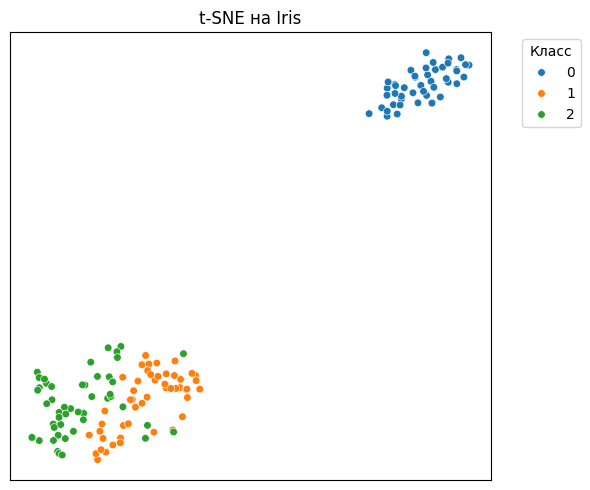

t-SNE: внутрикласс.=3.512, межкласс.=22.740, ratio=6.475


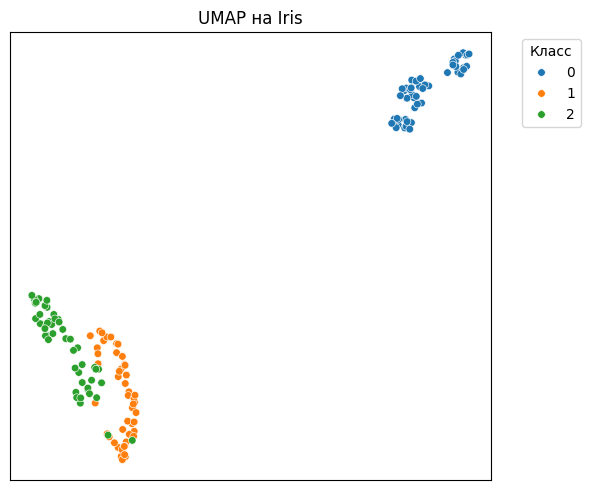

UMAP: внутрикласс.=1.887, межкласс.=13.308, ratio=7.054


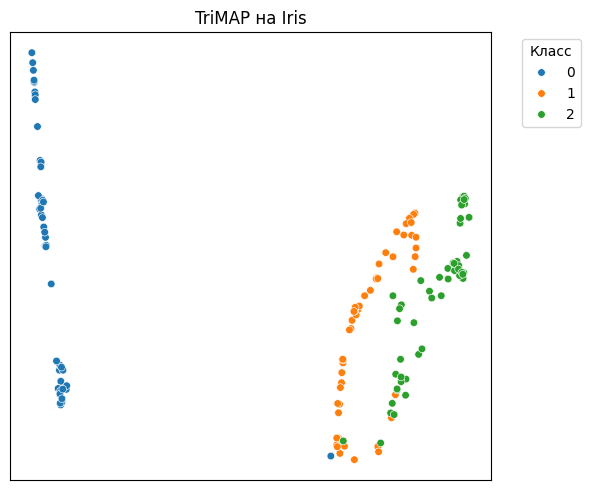

TriMAP: внутрикласс.=10.810, межкласс.=60.602, ratio=5.606


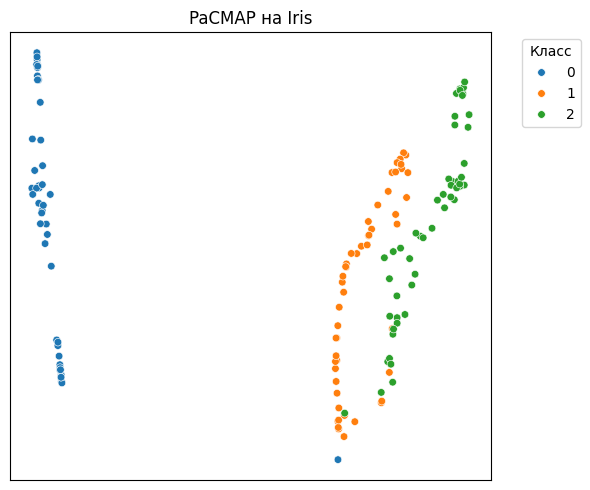

PaCMAP: внутрикласс.=3.471, межкласс.=17.697, ratio=5.099


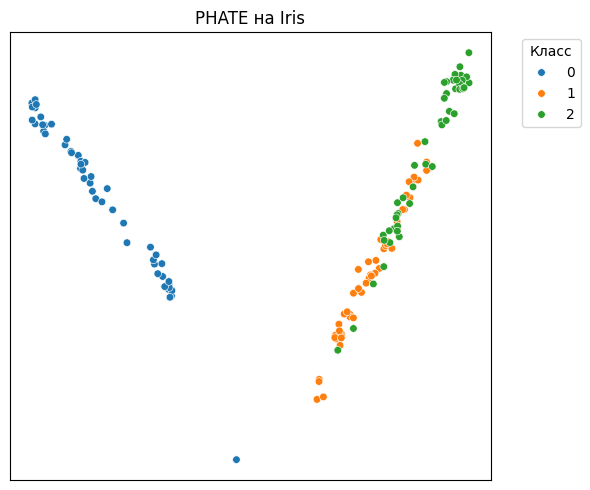

PHATE: внутрикласс.=0.026, межкласс.=0.121, ratio=4.610


In [17]:
X_list = []
names = []

X_tsne_iris = run_tsne(X_iris_scaled, random_state=42)
X_list.append(X_tsne_iris); names.append("t-SNE")

X_umap_iris = run_umap(X_iris_scaled, random_state=42)
X_list.append(X_umap_iris); names.append("UMAP")

X_trimap_iris = run_trimap(X_iris_scaled)
X_list.append(X_trimap_iris); names.append("TriMAP")

X_pacmap_iris = run_pacmap(X_iris_scaled, random_state=42)
X_list.append(X_pacmap_iris); names.append("PaCMAP")

X_phate_iris = run_phate(X_iris_scaled, random_state=42)
X_list.append(X_phate_iris); names.append("PHATE")


for X_emb, name in zip(X_list, names):
    plot_embedding(X_emb, y_iris, f"{name} на Iris")
    same, diff, ratio = separation_score(X_emb, y_iris)
    print(
        f"{name}: внутрикласс.={same:.3f}, межкласс.={diff:.3f}, ratio={ratio:.3f}"
    )

# Мой датасет

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Calculating PHATE...
  Running PHATE on 13387 observations and 16 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 1.76 seconds.
    Calculating affinities...


/usr/local/lib/python3.12/dist-packages/graphtools/graphs.py:810: RuntimeWarning: Detected zero distance between 48 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    Calculated affinities in 0.44 seconds.
  Calculated graph and diffusion operator in 2.22 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 1.39 seconds.
    Calculating KMeans...
    Calculated KMeans in 9.75 seconds.
  Calculated landmark operator in 11.14 seconds.
  Calculating optimal t...
    Automatically selected t = 22
  Calculated optimal t in 4.37 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 3.86 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 3.54 seconds.
Calculated PHATE in 25.94 seconds.


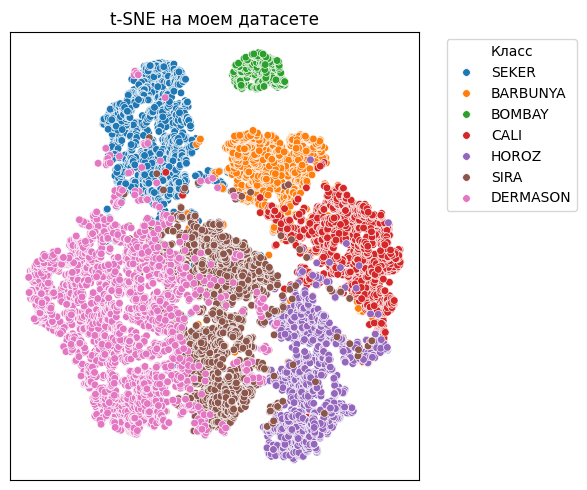

t-SNE: внутрикласс.=33.460, межкласс.=80.749, ratio=2.413


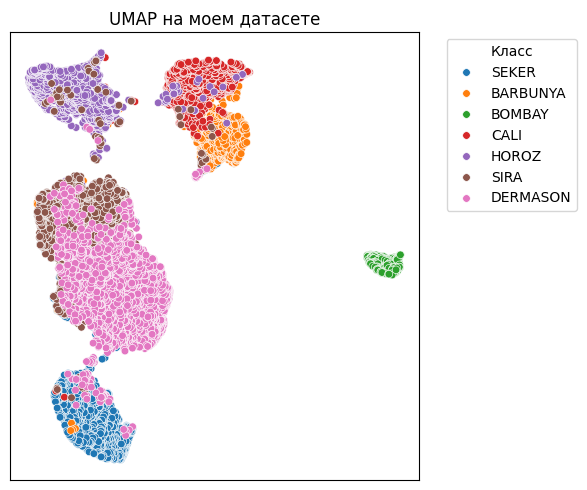

UMAP: внутрикласс.=2.721, межкласс.=10.142, ratio=3.728


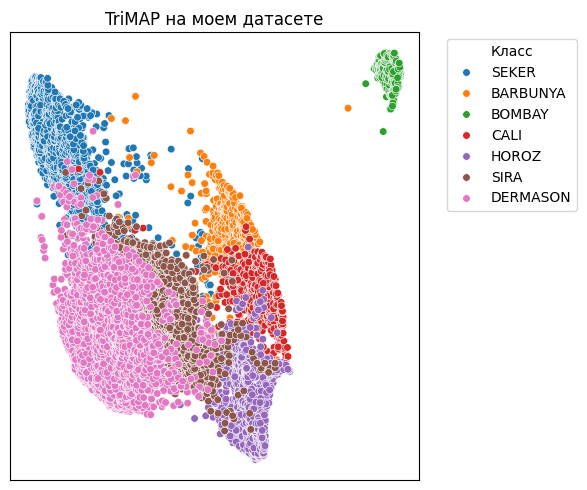

TriMAP: внутрикласс.=18.145, межкласс.=65.810, ratio=3.627


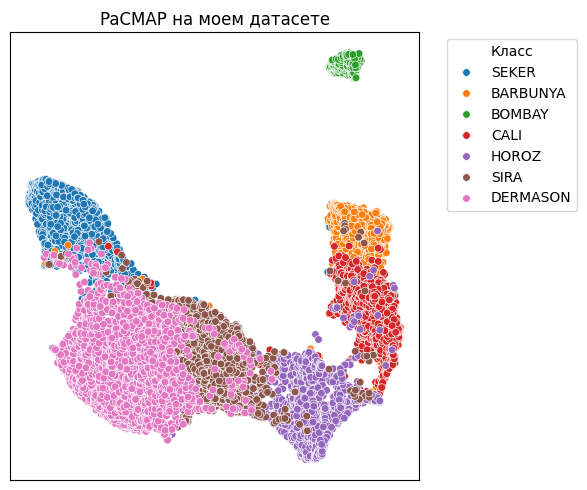

PaCMAP: внутрикласс.=4.621, межкласс.=16.660, ratio=3.605


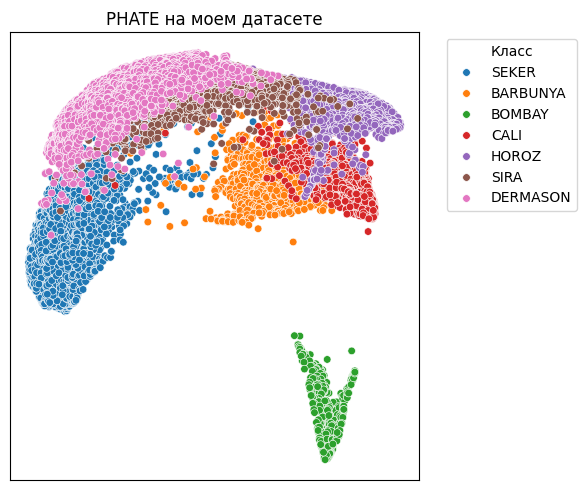

PHATE: внутрикласс.=0.009, межкласс.=0.030, ratio=3.356


In [18]:
X_list = []
names = []

X_tsne_own = run_tsne(X_own_scaled, random_state=42)
X_list.append(X_tsne_own); names.append("t-SNE")

X_umap_own = run_umap(X_own_scaled, random_state=42)
X_list.append(X_umap_own); names.append("UMAP")

X_trimap_own = run_trimap(X_own_scaled)
X_list.append(X_trimap_own); names.append("TriMAP")

X_pacmap_own = run_pacmap(X_own_scaled, random_state=42)
X_list.append(X_pacmap_own); names.append("PaCMAP")

X_phate_own = run_phate(X_own_scaled, random_state=42)
X_list.append(X_phate_own); names.append("PHATE")

for X_emb, name in zip(X_list, names):
    plot_embedding(X_emb, y_own_labels, f"{name} на моем датасете")
    same, diff, ratio = separation_score(X_emb, y_own_labels)
    print(
        f"{name}: внутрикласс.={same:.3f}, межкласс.={diff:.3f}, ratio={ratio:.3f}"
    )

Сравнение устойчивости

# t-SNE

## IRIS

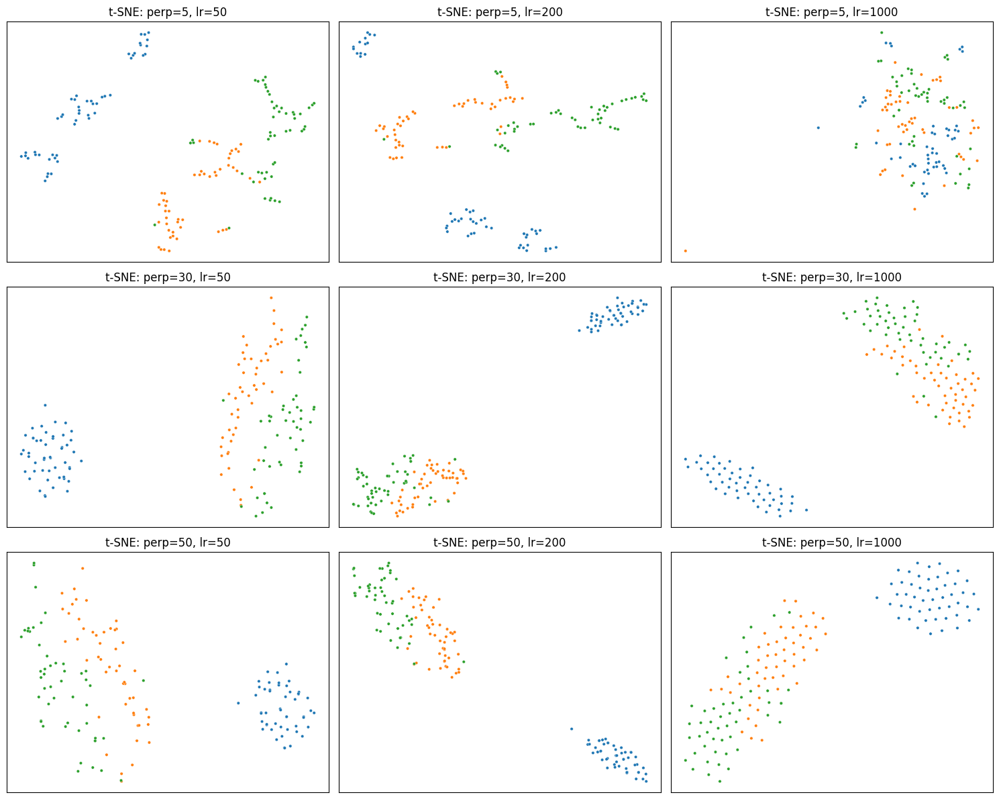

In [19]:
perplexities = [5, 30, 50]
lrs = [50, 200, 1000]

fig, axes = plt.subplots(len(perplexities), len(lrs), figsize=(5*len(lrs), 4*len(perplexities)))

for i, perp in enumerate(perplexities):
    for j, lr in enumerate(lrs):
        X_emb = run_tsne(X_iris_scaled, random_state=42, perplexity=perp, learning_rate=lr)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_iris, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"t-SNE: perp={perp}, lr={lr}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

# Мой датасет

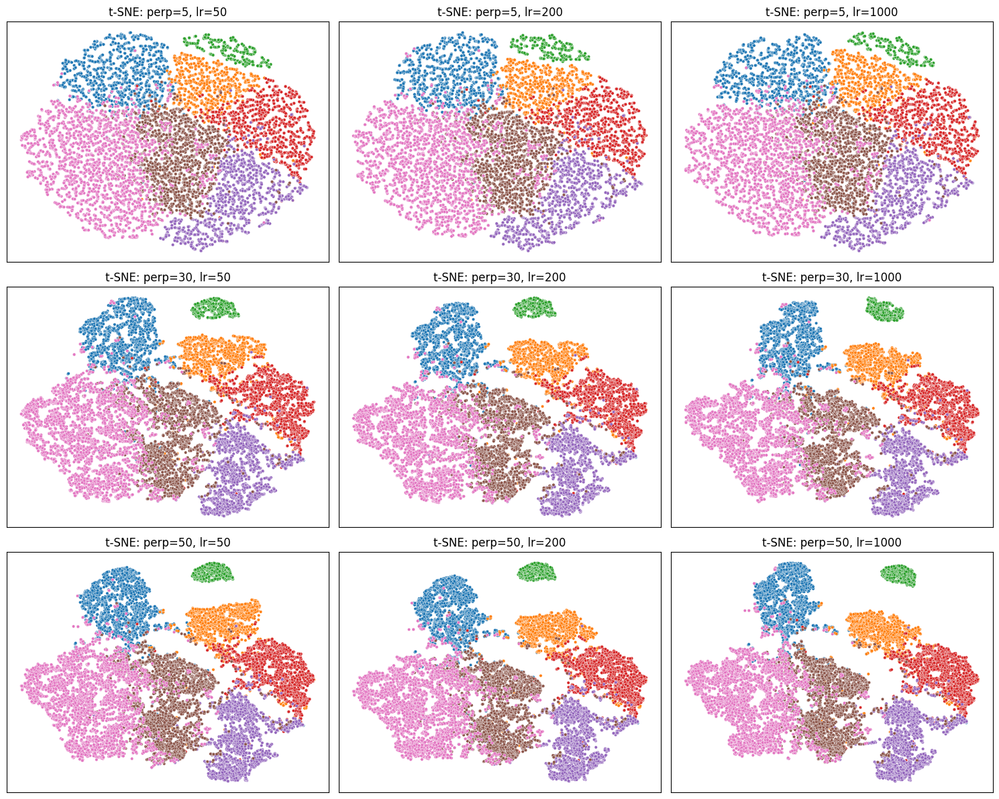

In [20]:
perplexities = [5, 30, 50]
lrs = [50, 200, 1000]

fig, axes = plt.subplots(len(perplexities), len(lrs), figsize=(5*len(lrs), 4*len(perplexities)))

for i, perp in enumerate(perplexities):
    for j, lr in enumerate(lrs):
        X_emb = run_tsne(X_own_scaled, random_state=42, perplexity=perp, learning_rate=lr)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"t-SNE: perp={perp}, lr={lr}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

Нужно описать, как меняется форма и расположение кластеров при разных perplexity и learning_rate и что визуализация t‑SNE может сильно меняться.

# UMAP

## IRIS

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr

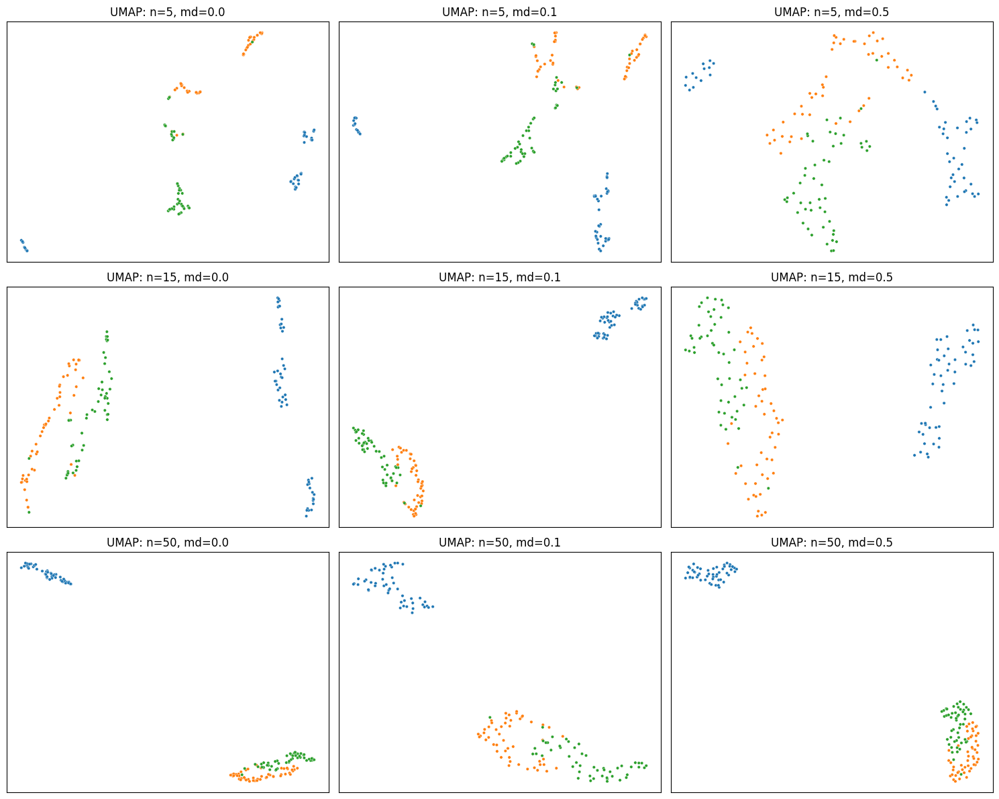

In [21]:
n_neighbors_list = [5, 15, 50]
min_dist_list = [0.0, 0.1, 0.5]

fig, axes = plt.subplots(len(n_neighbors_list), len(min_dist_list), figsize=(5*len(min_dist_list), 4*len(n_neighbors_list)))

for i, n_neighbors in enumerate(n_neighbors_list):
    for j, min_dist in enumerate(min_dist_list):
        X_emb = run_umap(X_iris_scaled, random_state=42, n_neighbors=n_neighbors, min_dist=min_dist)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_iris, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"UMAP: n={n_neighbors}, md={min_dist}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

## Мой датасет

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr

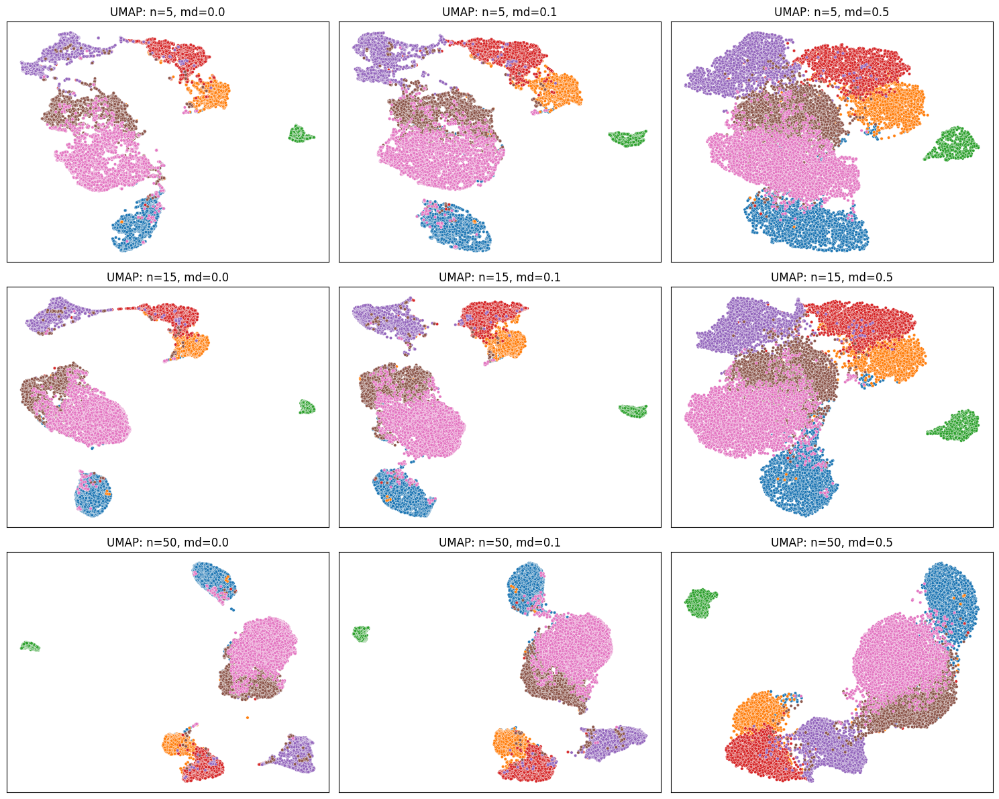

In [22]:
n_neighbors_list = [5, 15, 50]
min_dist_list = [0.0, 0.1, 0.5]

fig, axes = plt.subplots(len(n_neighbors_list), len(min_dist_list), figsize=(5*len(min_dist_list), 4*len(n_neighbors_list)))

for i, n_neighbors in enumerate(n_neighbors_list):
    for j, min_dist in enumerate(min_dist_list):
        X_emb = run_umap(X_own_scaled, random_state=42, n_neighbors=n_neighbors, min_dist=min_dist)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"UMAP: n={n_neighbors}, md={min_dist}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

# TRIMAP

## IRIS

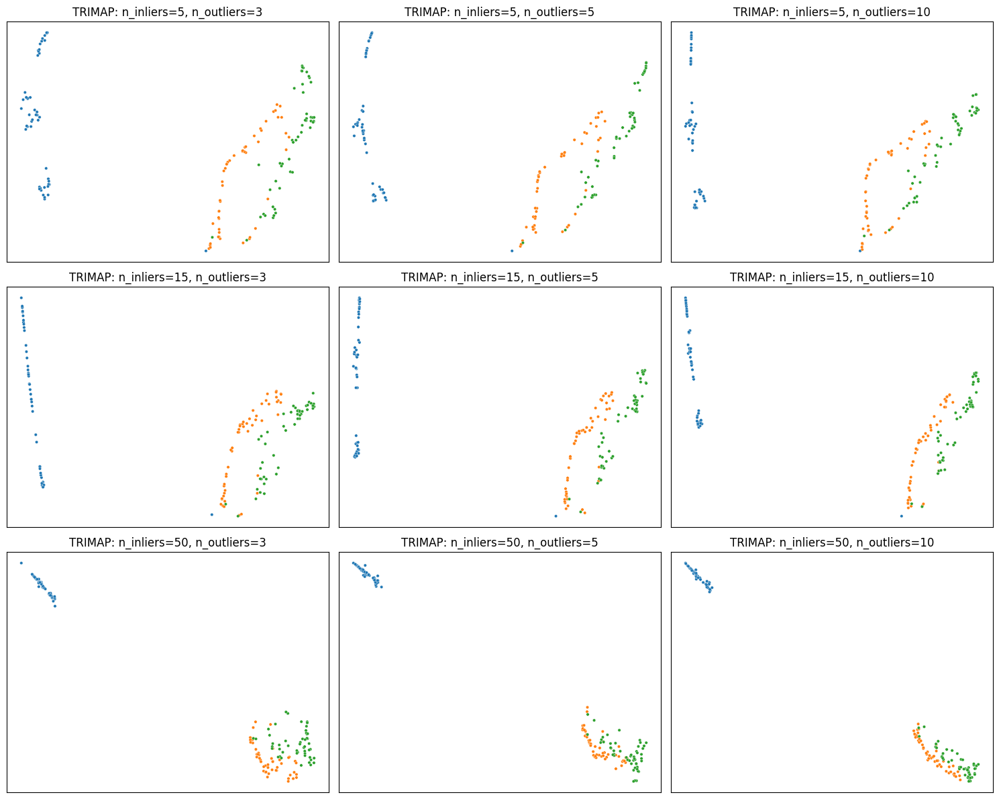

In [23]:
n_inliers_list = [5, 15, 50]
n_outliers_list = [3, 5, 10]

fig, axes = plt.subplots(len(n_inliers_list), len(n_outliers_list), figsize=(5*len(n_outliers_list), 4*len(n_inliers_list)))

for i, n_inliers in enumerate(n_inliers_list):
    for j, n_outliers in enumerate(n_outliers_list):
        X_emb = run_trimap(X_iris_scaled, n_inliers=n_inliers, n_outliers=n_outliers)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_iris, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"TRIMAP: n_inliers={n_inliers}, n_outliers={n_outliers}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

## Мой датасет

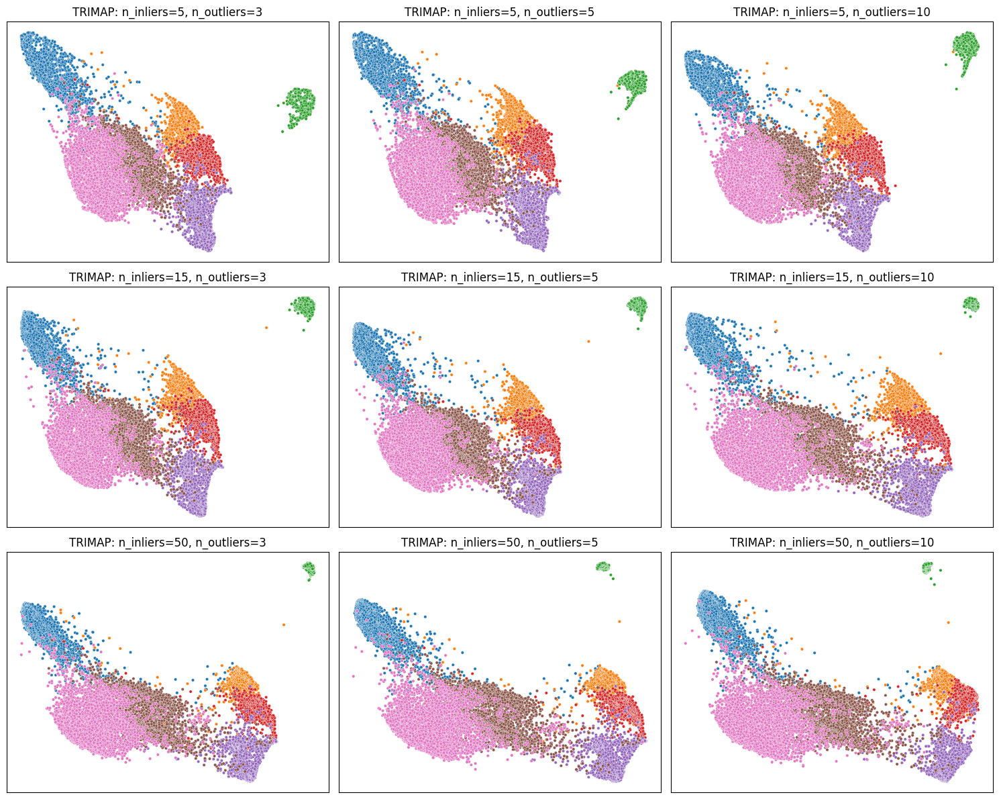

In [24]:
n_inliers_list = [5, 15, 50]
n_outliers_list = [3, 5, 10]

fig, axes = plt.subplots(len(n_inliers_list), len(n_outliers_list), figsize=(5*len(n_outliers_list), 4*len(n_inliers_list)))

for i, n_inliers in enumerate(n_inliers_list):
    for j, n_outliers in enumerate(n_outliers_list):
        X_emb = run_trimap(X_own_scaled, n_inliers=n_inliers, n_outliers=n_outliers)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"TRIMAP: n_inliers={n_inliers}, n_outliers={n_outliers}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

# PaCMAP

## IRIS

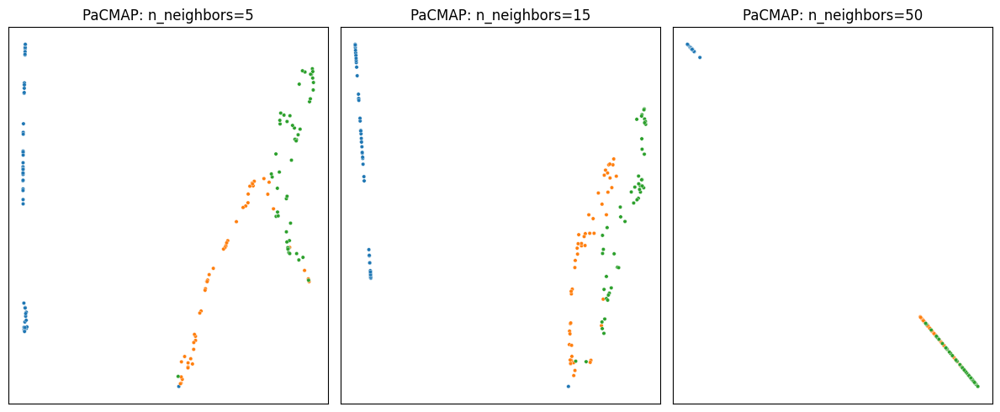

In [25]:
n_neighbors_list = [5, 15, 50]

fig, axes = plt.subplots(1, len(n_neighbors_list), figsize=(4*len(n_neighbors_list), 5))

for i, n_neighbors in enumerate(n_neighbors_list):
    X_emb = run_pacmap(X_iris_scaled, random_state=42, n_neighbors=n_neighbors)
    ax = axes[i]
    sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_iris, palette="tab10", s=10, ax=ax, legend=False)
    ax.set_title(f"PaCMAP: n_neighbors={n_neighbors}")
    ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

## Мой датасет

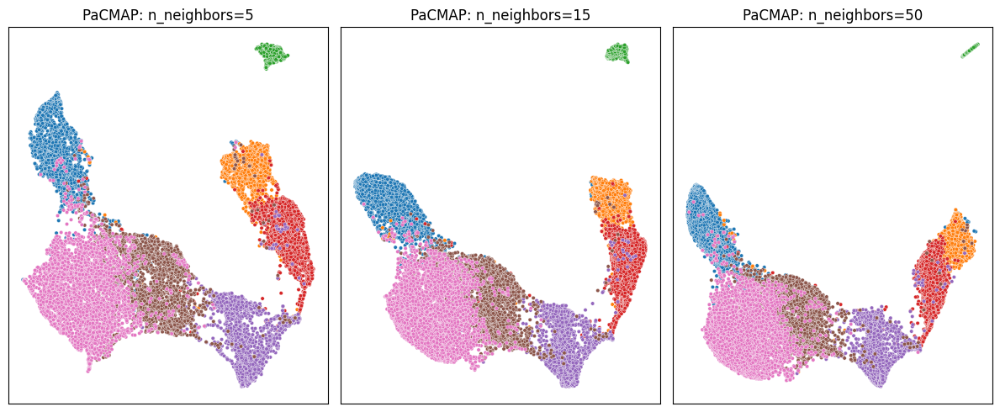

In [26]:
n_neighbors_list = [5, 15, 50]

fig, axes = plt.subplots(1, len(n_neighbors_list), figsize=(4*len(n_neighbors_list), 5))

for i, n_neighbors in enumerate(n_neighbors_list):
    X_emb = run_pacmap(X_own_scaled, random_state=42, n_neighbors=n_neighbors)
    ax = axes[i]
    sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
    ax.set_title(f"PaCMAP: n_neighbors={n_neighbors}")
    ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

# PHATE

## IRIS

Calculating PHATE...
  Running PHATE on 150 observations and 4 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculating affinities...
  Calculated graph and diffusion operator in 0.01 seconds.
  Calculating optimal t...
    Automatically selected t = 21
  Calculated optimal t in 0.03 seconds.
  Calculating diffusion potential...
  Calculating metric MDS...


/usr/local/lib/python3.12/dist-packages/graphtools/graphs.py:803: RuntimeWarning: Detected zero distance between samples 101 and 142. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    SGD-MDS may not have converged: stress changed by 1.4% in final iterations. Consider increasing n_iter or adjusting learning_rate.
  Calculated metric MDS in 0.26 seconds.
Calculated PHATE in 0.31 seconds.
Calculating PHATE...
  Running PHATE on 150 observations and 4 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculating affinities...
  Calculated graph and diffusion operator in 0.02 seconds.
  Calculating optimal t...
    Automatically selected t = 22
  Calculated optimal t in 0.01 seconds.
  Calculating diffusion potential...
  Calculating metric MDS...


/usr/local/lib/python3.12/dist-packages/graphtools/graphs.py:803: RuntimeWarning: Detected zero distance between samples 101 and 142. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    SGD-MDS may not have converged: stress changed by -1.4% in final iterations. Consider increasing n_iter or adjusting learning_rate.
  Calculated metric MDS in 0.23 seconds.
Calculated PHATE in 0.27 seconds.
Calculating PHATE...
  Running PHATE on 150 observations and 4 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculating affinities...
  Calculated graph and diffusion operator in 0.02 seconds.
  Calculating optimal t...
    Automatically selected t = 4
  Calculated optimal t in 0.01 seconds.
  Calculating diffusion potential...
  Calculating metric MDS...


/usr/local/lib/python3.12/dist-packages/graphtools/graphs.py:803: RuntimeWarning: Detected zero distance between samples 101 and 142. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    SGD-MDS may not have converged: stress changed by -2.4% in final iterations. Consider increasing n_iter or adjusting learning_rate.
  Calculated metric MDS in 0.26 seconds.
Calculated PHATE in 0.30 seconds.


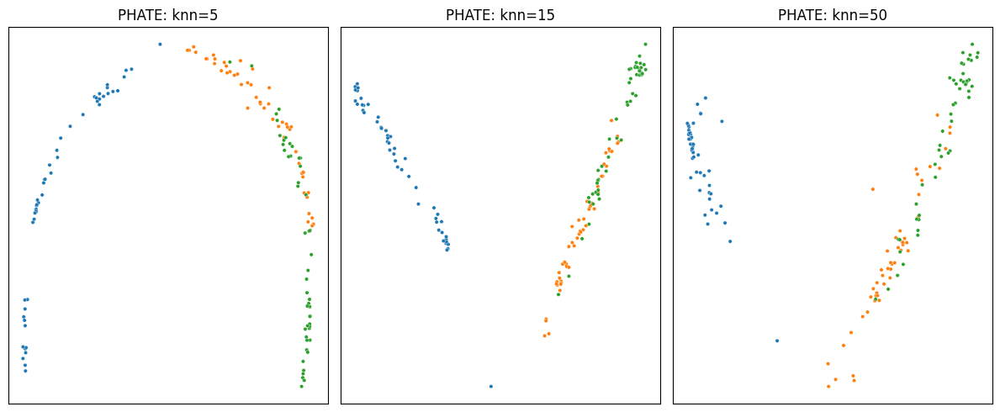

In [27]:
knn_list = [5, 15, 50]

fig, axes = plt.subplots(1, len(knn_list), figsize=(4*len(knn_list), 5))

for i, knn in enumerate(knn_list):
    X_emb = run_phate(X_iris_scaled, random_state=42, knn=knn)
    ax = axes[i]
    sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_iris, palette="tab10", s=10, ax=ax, legend=False)
    ax.set_title(f"PHATE: knn={knn}")
    ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

## Мой датасет

Calculating PHATE...
  Running PHATE on 13387 observations and 16 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 1.19 seconds.
    Calculating affinities...


/usr/local/lib/python3.12/dist-packages/graphtools/graphs.py:810: RuntimeWarning: Detected zero distance between 48 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    Calculated affinities in 0.42 seconds.
  Calculated graph and diffusion operator in 1.62 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 2.54 seconds.
    Calculating KMeans...
    Calculated KMeans in 11.77 seconds.
  Calculated landmark operator in 14.32 seconds.
  Calculating optimal t...
    Automatically selected t = 31
  Calculated optimal t in 4.48 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 3.41 seconds.
  Calculating metric MDS...
    SGD-MDS may not have converged: stress changed by -1.6% in final iterations. Consider increasing n_iter or adjusting learning_rate.
  Calculated metric MDS in 4.51 seconds.
Calculated PHATE in 29.36 seconds.
Calculating PHATE...
  Running PHATE on 13387 observations and 16 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 1.63 seconds.
    Calculating affinities...


/usr/local/lib/python3.12/dist-packages/graphtools/graphs.py:810: RuntimeWarning: Detected zero distance between 48 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    Calculated affinities in 0.45 seconds.
  Calculated graph and diffusion operator in 2.10 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 1.38 seconds.
    Calculating KMeans...
    Calculated KMeans in 9.14 seconds.
  Calculated landmark operator in 10.52 seconds.
  Calculating optimal t...
    Automatically selected t = 22
  Calculated optimal t in 4.34 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 2.61 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 4.43 seconds.
Calculated PHATE in 24.80 seconds.
Calculating PHATE...
  Running PHATE on 13387 observations and 16 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 2.83 seconds.
    Calculating affinities...


/usr/local/lib/python3.12/dist-packages/graphtools/graphs.py:810: RuntimeWarning: Detected zero distance between 48 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    Calculated affinities in 0.63 seconds.
  Calculated graph and diffusion operator in 3.53 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 2.45 seconds.
    Calculating KMeans...
    Calculated KMeans in 13.37 seconds.
  Calculated landmark operator in 15.83 seconds.
  Calculating optimal t...
    Automatically selected t = 16
  Calculated optimal t in 5.87 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 1.78 seconds.
  Calculating metric MDS...
    SGD-MDS may not have converged: stress changed by -1.5% in final iterations. Consider increasing n_iter or adjusting learning_rate.
  Calculated metric MDS in 3.54 seconds.
Calculated PHATE in 31.41 seconds.


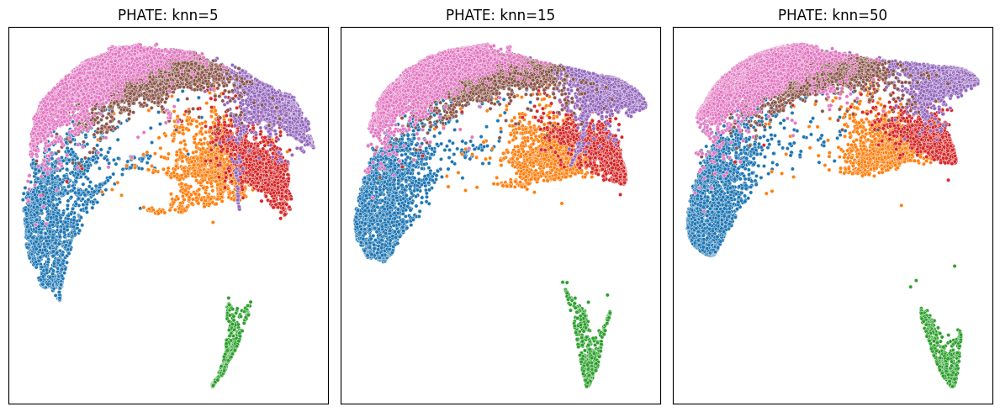

In [28]:
knn_list = [5, 15, 50]

fig, axes = plt.subplots(1, len(knn_list), figsize=(4*len(knn_list), 5))

for i, knn in enumerate(knn_list):
    X_emb = run_phate(X_own_scaled, random_state=42, knn=knn)
    ax = axes[i]
    sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
    ax.set_title(f"PHATE: knn={knn}")
    ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

Обычно структура UMAP меняется плавнее, кластеры остаются узнаваемыми при разумном диапазоне параметров.

*Задача* Аналогично нужно сделать по одной строке графиков для TriMAP, PaCMAP, PHATE с варьированием ключевого параметра (количество соседей или похожий гиперпараметр) и показать, насколько устойчив рисунок.

| Метод  | Скорость на больших данных                   | Локальное разделение              | Глобальная структура                            | Чувствительность к параметрам                         | Комментарий                                        |
| ------ | -------------------------------------------- | --------------------------------- | ----------------------------------------------- | ----------------------------------------------------- | -------------------------------------------------- |
| t‑SNE  | Низкая l                    | Отличное                   | Слабая                                   | Высокая (perplexity, lr, random_state) | Хорошо для локальных кластеров, тяжёлый тюнинг     |
| UMAP   | Высокая l                   | Очень хорошее   | Лучшая, чем у t‑SNE           | Ниже, чем у t‑SNE                      | Хороший баланс локал/глобал, удобен в практике     |
| TriMAP | Средняя                              | Хорошее                   | Сильный упор на глобальную структуру    | Умеренная                                     | Лучше показывает относительное положение кластеров |
| PaCMAP | Средняя                               | Отличное                   | Хорошее                                  | Умеренная                                      | Часто даёт чёткие кластеры и форму многобразия     |
| PHATE  | Средняя/низкая (зависит от размера)   | Хорошее        | Очень хорошее, особенно для траекторий   | Умеренная                          | Сильный метод для непрерывных переходов            |

# Варианты препроцессинга
*Задача* — явно сравнить, как UMAP и t‑SNE реагируют на разные варианты нормировки и отбора признаков.

## Определяем три сценария
Без масштабирования (сырой набор признаков).

StandardScaler (z‑нормировка).

MinMaxScaler + отбор признаков по дисперсии (эмуляция feature selection).

Задание. Проделать все три сценария. Обучить все модели при разных сценария кластеризации.
Нужно в результате:
1. описать, какие признаки были отброшены и почему это может влиять на качество кластеризации во вложенном пространстве.
1. сравнить вычислительное время и сделать вывод о масштабируемости методов
1. изменить гиперпараметры (perplexity, n_neighbors, min_dist) и исследовать совместное влияние гиперпараметров и препроцессинга на структуру кластеров.

# UMAP

## 1) Без масштабирования

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully conne

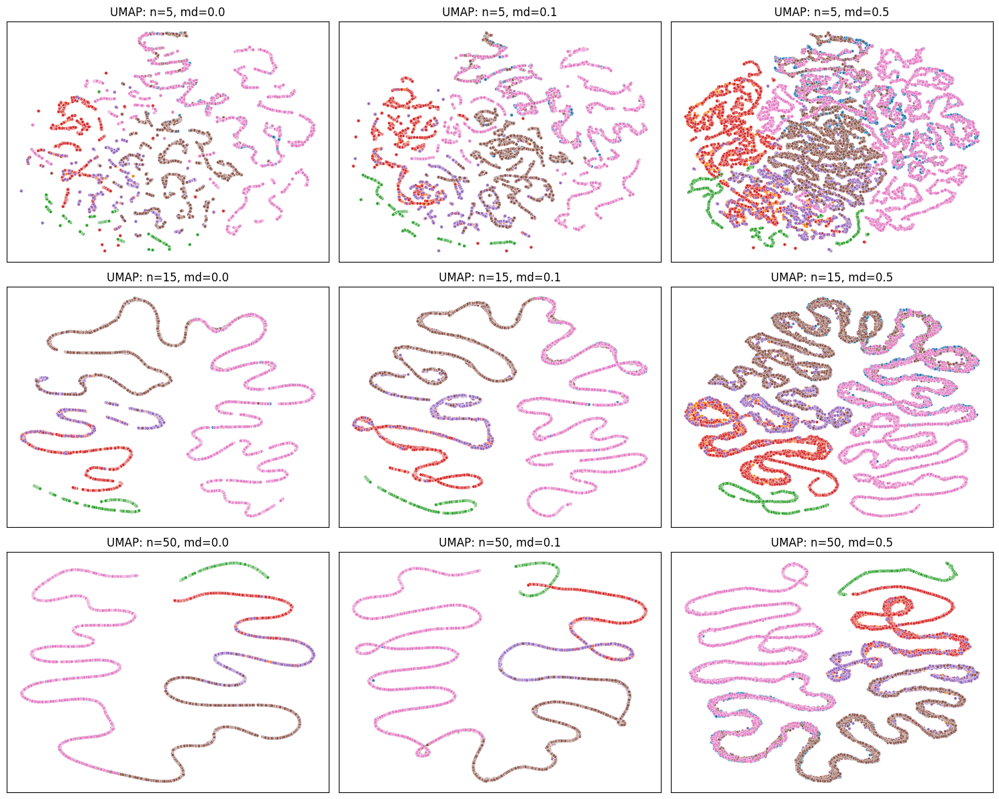

CPU times: user 5min 2s, sys: 1.04 s, total: 5min 3s
Wall time: 3min 29s


In [29]:
%%time
n_neighbors_list = [5, 15, 50]
min_dist_list = [0.0, 0.1, 0.5]

fig, axes = plt.subplots(len(n_neighbors_list), len(min_dist_list), figsize=(5*len(min_dist_list), 4*len(n_neighbors_list)))

for i, n_neighbors in enumerate(n_neighbors_list):
    for j, min_dist in enumerate(min_dist_list):
        X_emb = run_umap(X_own, random_state=42, n_neighbors=n_neighbors, min_dist=min_dist)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"UMAP: n={n_neighbors}, md={min_dist}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

## 2) StandardScaler

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr

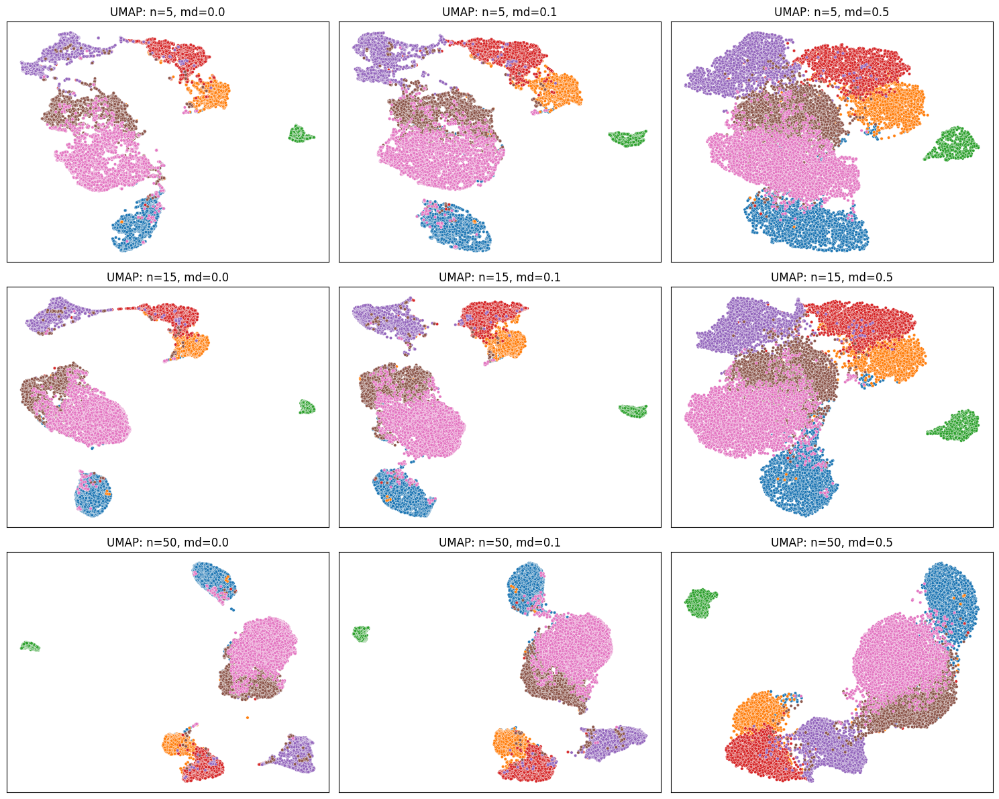

CPU times: user 1min 39s, sys: 623 ms, total: 1min 40s
Wall time: 1min 34s


In [30]:
%%time
n_neighbors_list = [5, 15, 50]
min_dist_list = [0.0, 0.1, 0.5]

fig, axes = plt.subplots(len(n_neighbors_list), len(min_dist_list), figsize=(5*len(min_dist_list), 4*len(n_neighbors_list)))

for i, n_neighbors in enumerate(n_neighbors_list):
    for j, min_dist in enumerate(min_dist_list):
        X_emb = run_umap(X_own_scaled, random_state=42, n_neighbors=n_neighbors, min_dist=min_dist)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"UMAP: n={n_neighbors}, md={min_dist}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

## 3) MinMaxScaler + отбор признаков

In [31]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import VarianceThreshold

X_own_min_max_scaled = pd.DataFrame(MinMaxScaler().fit_transform(X_own), columns=feature_cols)
feature_selector = VarianceThreshold()
feature_selector.fit(X_own_min_max_scaled)

VarianceThreshold()

In [32]:
threshold = 0.01
selected_features = sorted(zip(feature_selector.variances_, feature_selector.feature_names_in_))
selected_features = [x[1] for x in selected_features if x[0] >= threshold]
selected_features

['roundness',
 'ConvexArea',
 'Area',
 'MinorAxisLength',
 'EquivDiameter',
 'Perimeter',
 'MajorAxisLength',
 'ShapeFactor1',
 'Extent',
 'Eccentricity',
 'AspectRation',
 'ShapeFactor3',
 'Compactness',
 'ShapeFactor2']

In [33]:
dropped_features = [x for x in feature_cols if x not in selected_features]
dropped_features

['Solidity', 'ShapeFactor4']

In [34]:
X_own_min_max_scaled_selected = X_own_min_max_scaled[selected_features].to_numpy()
X_own_min_max_scaled_selected.shape

(13387, 14)

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr

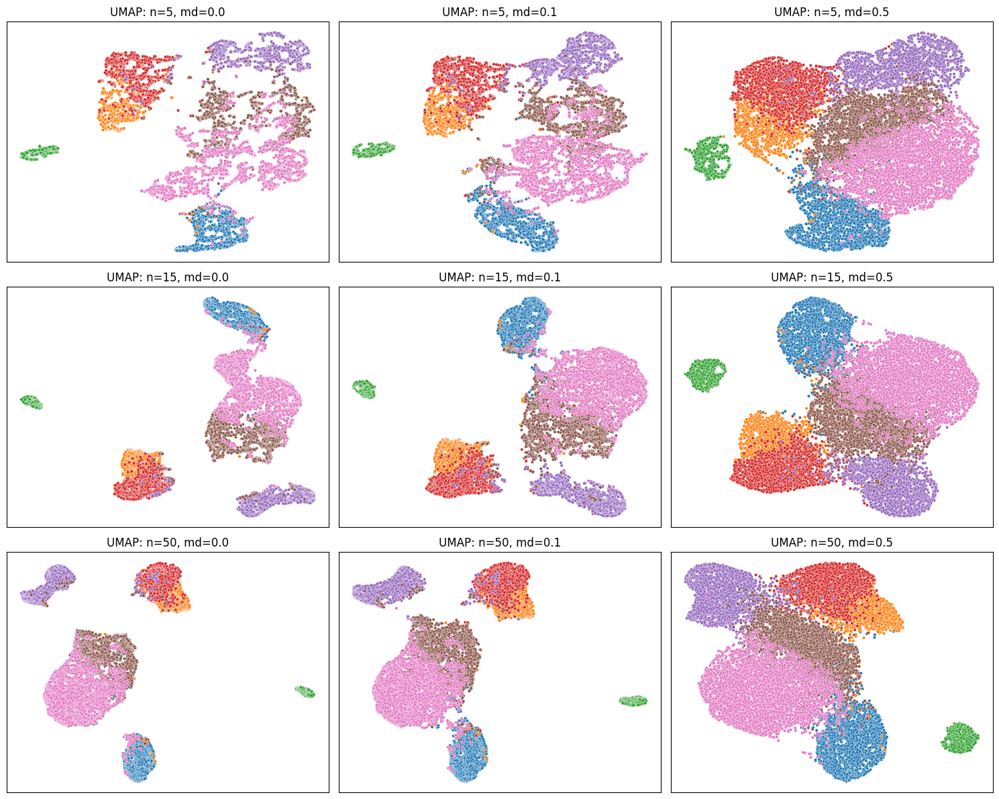

CPU times: user 1min 41s, sys: 643 ms, total: 1min 42s
Wall time: 1min 34s


In [35]:
%%time
n_neighbors_list = [5, 15, 50]
min_dist_list = [0.0, 0.1, 0.5]

fig, axes = plt.subplots(len(n_neighbors_list), len(min_dist_list), figsize=(5*len(min_dist_list), 4*len(n_neighbors_list)))

for i, n_neighbors in enumerate(n_neighbors_list):
    for j, min_dist in enumerate(min_dist_list):
        X_emb = run_umap(X_own_min_max_scaled_selected, random_state=42, n_neighbors=n_neighbors, min_dist=min_dist)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"UMAP: n={n_neighbors}, md={min_dist}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

# t-SNE

## 1) Без масштабирования

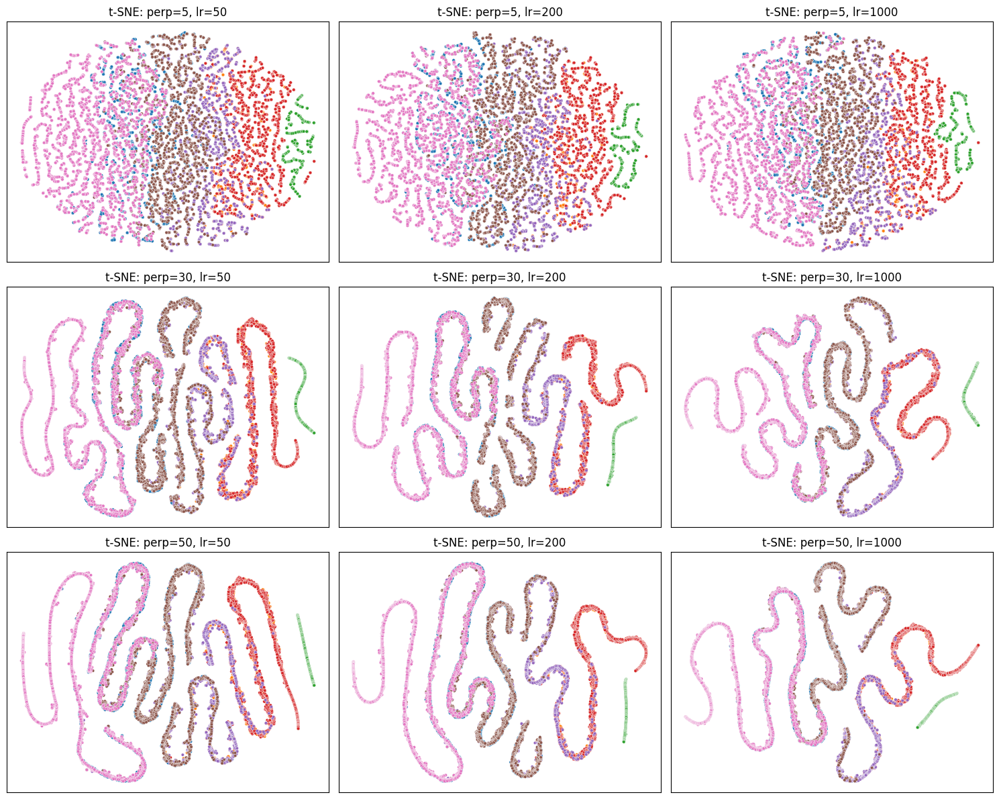

CPU times: user 15min 4s, sys: 683 ms, total: 15min 5s
Wall time: 15min 7s


In [36]:
%%time
perplexities = [5, 30, 50]
lrs = [50, 200, 1000]

fig, axes = plt.subplots(len(perplexities), len(lrs), figsize=(5*len(lrs), 4*len(perplexities)))

for i, perp in enumerate(perplexities):
    for j, lr in enumerate(lrs):
        X_emb = run_tsne(X_own, random_state=42, perplexity=perp, learning_rate=lr)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"t-SNE: perp={perp}, lr={lr}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

## 2) StandardScaler

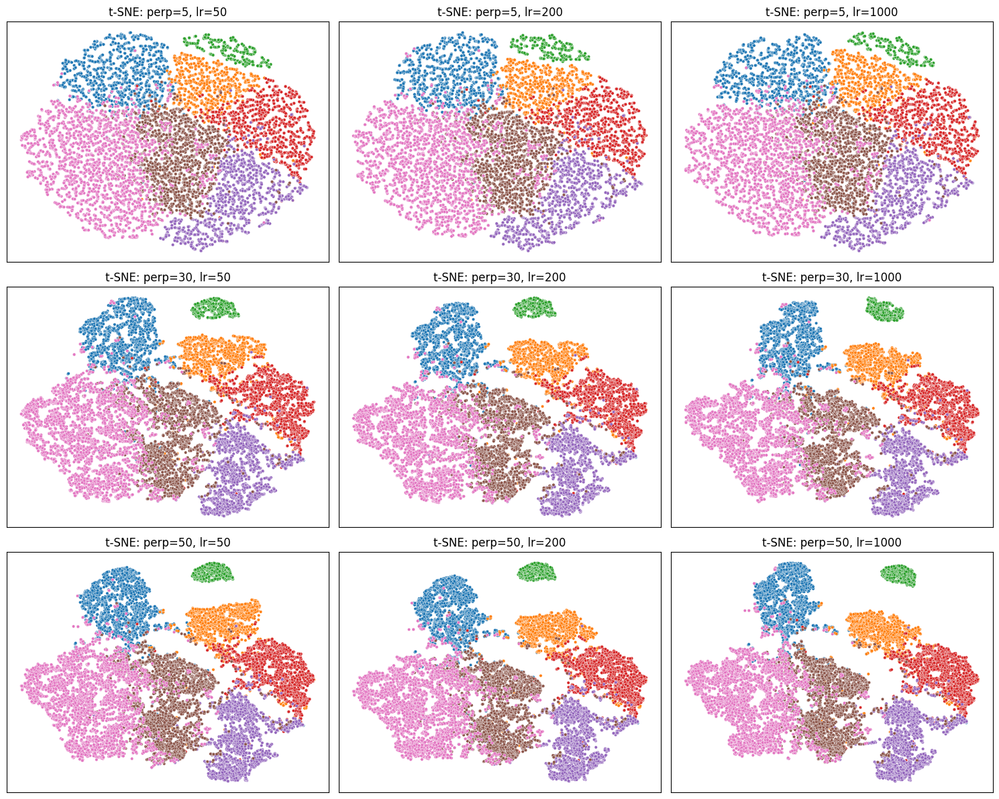

CPU times: user 16min 36s, sys: 577 ms, total: 16min 36s
Wall time: 16min 39s


In [37]:
%%time
perplexities = [5, 30, 50]
lrs = [50, 200, 1000]

fig, axes = plt.subplots(len(perplexities), len(lrs), figsize=(5*len(lrs), 4*len(perplexities)))

for i, perp in enumerate(perplexities):
    for j, lr in enumerate(lrs):
        X_emb = run_tsne(X_own_scaled, random_state=42, perplexity=perp, learning_rate=lr)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"t-SNE: perp={perp}, lr={lr}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

## 3) MinMaxScaler + отбор признаков

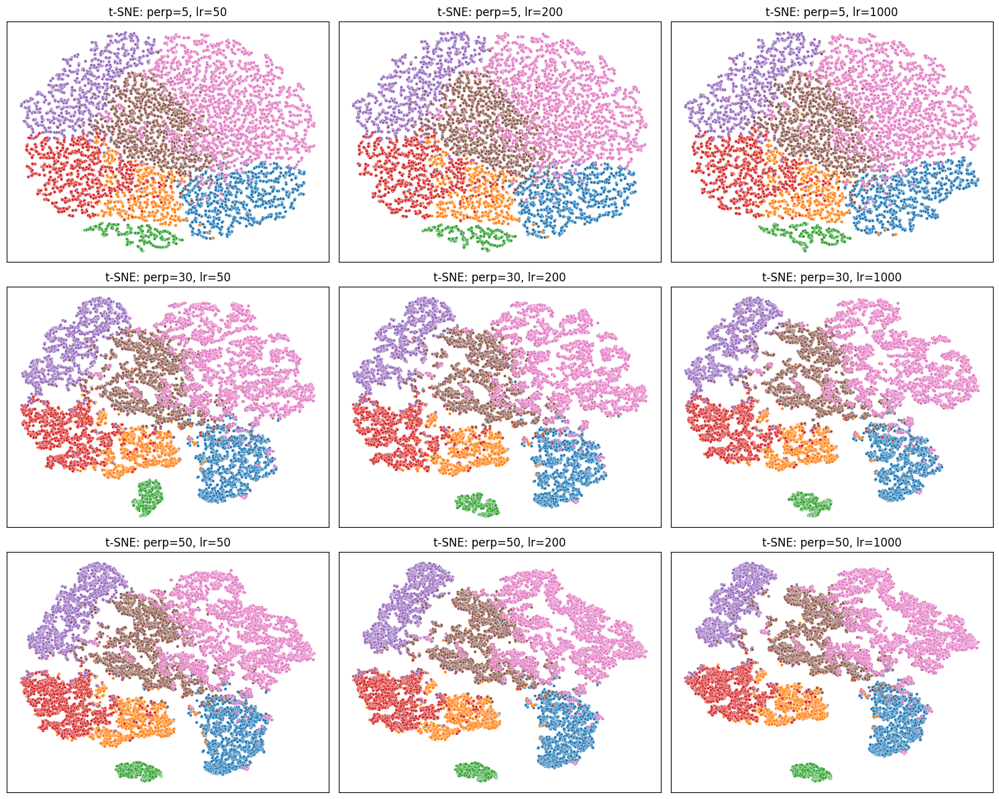

CPU times: user 15min 59s, sys: 579 ms, total: 15min 59s
Wall time: 16min 2s


In [38]:
%%time
perplexities = [5, 30, 50]
lrs = [50, 200, 1000]

fig, axes = plt.subplots(len(perplexities), len(lrs), figsize=(5*len(lrs), 4*len(perplexities)))

for i, perp in enumerate(perplexities):
    for j, lr in enumerate(lrs):
        X_emb = run_tsne(X_own_min_max_scaled_selected, random_state=42, perplexity=perp, learning_rate=lr)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"t-SNE: perp={perp}, lr={lr}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

## 1) Были отброшены признаки с низкой дисперсией после MinMaxScaler - это признаки, которые после приведения к диапазону [0, 1] имеют очень малый разброс значений. Удаление таких признаков может улучшить кластеризацию, так как они вносят мало информации, но добавляют шум в расчёт расстояний.
## 2) Для UMAP добавление StandardScaler заметно влияет на качество кластеризации на датасете Dry Bean, так как признаки имеют очень разный масштаб. Без нормировки признаки с большим масштабом доминируют в расчёте расстояний.
## 3) Для UMAP параметр min_dist при увеличении сильнее группирует точки в компактные облака, а при уменьшении кластеры становятся более рыхлыми. Параметр n_neighbors регулирует степень смешивания классов - при больших значениях кластеры более гладкие, при маленьких появляются отдельные вкрапления точек другого класса. Для t-SNE параметр perplexity оказывает основное влияние: при малых значениях (5) все классы сливаются в единый овал, при больших (30-50) формируются отдельные кластеры. Learning_rate влияет слабо.